**Roll no:21i-2682**

**Kisaa Fatima**

**Question 1**

**Assignment 3**

====================================================

**LAZZY SNAPPING**
It allows users to quickly and effectively segment an image into foreground and background regions by marking a few foreground and background pixels.

**Collective output:**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-11-d710ecffd26d>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (64). Possibly due to duplicate points in X.
  kmeans = KMeans(n_clusters=k, random_state=0).fit(data_points)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-11-d710ecffd26d>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (64). Possibly due to duplicate points in X.
  kmeans = KMeans(n_clusters=k, random_state=0).fit(data_points)


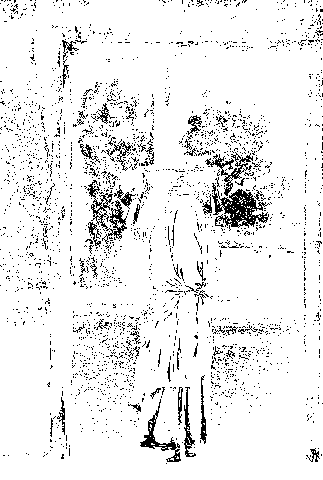

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

from sklearn.cluster import KMeans

def kmeans_clustering(k, data_points):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(data_points)
    cluster_indices = kmeans.labels_
    centroids = kmeans.cluster_centers_
    return cluster_indices, centroids

def lazy_snapping(image, fg_seed, bg_seed, N=64, wk=0.1):
    height, width, _ = image.shape
    image_data = image.reshape(-1, 3)

    # K-Means clustering for foreground seeds
    fg_seed_data = fg_seed.reshape(-1, 3)
    fg_cluster_indices, fg_centroids = kmeans_clustering(N, fg_seed_data)

    # K-Means clustering for background seeds
    bg_seed_data = bg_seed.reshape(-1, 3)
    bg_cluster_indices, bg_centroids = kmeans_clustering(N, bg_seed_data)

    # Compute likelihood for each pixel
    fg_likelihood = np.zeros((height*width, N))
    bg_likelihood = np.zeros((height*width, N))
    for i in range(N):
        fg_likelihood[:, i] = np.exp(-np.linalg.norm(image_data - fg_centroids[i], axis=1))
        bg_likelihood[:, i] = np.exp(-np.linalg.norm(image_data - bg_centroids[i], axis=1))

    # Compute overall likelihood
    pfg = np.sum(fg_likelihood, axis=1) / N
    pbg = np.sum(bg_likelihood, axis=1) / N

    # Pixel classification
    mask = np.zeros((height*width,))
    mask[pfg > pbg] = 255
    mask = mask.reshape(height, width).astype(np.uint8)

    return mask

from google.colab.patches import cv2_imshow

# Load the image and stroke images
image = cv2.imread('lady.PNG')
fg_seed = cv2.imread('lady stroke 1.png')
bg_seed = cv2.imread('lady stroke 2.png')  # Assuming both strokes are in the same image

# Perform Lazy Snapping
result = lazy_snapping(image, fg_seed, bg_seed)

# Display the result
cv2_imshow(result)



===================================================================

**About the Output:**



*   Original image with the background masked based on segmentation.
*   The original image itself.



*   
Original image with the foreground masked based on segmentation (inverted mask).






Results for N=4
total number of iterations:
35
total number of iterations:
21
With Background Pixel


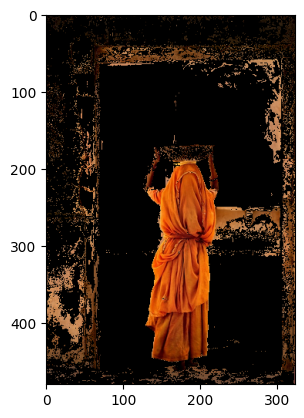

With the foreground pixels


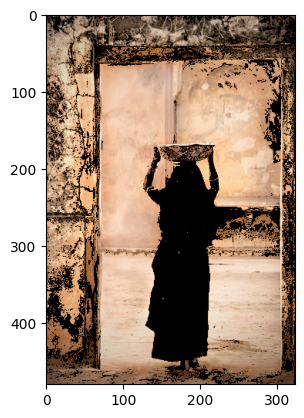

Original image


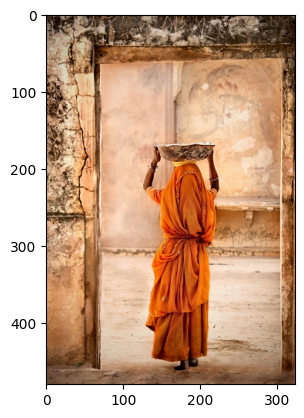

process time in minutes
0.1598157048225403
total number of iterations:
14
total number of iterations:
24
With Background Pixel


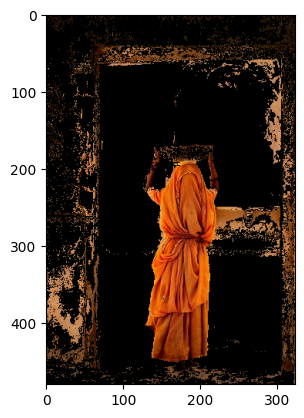

With the foreground pixels


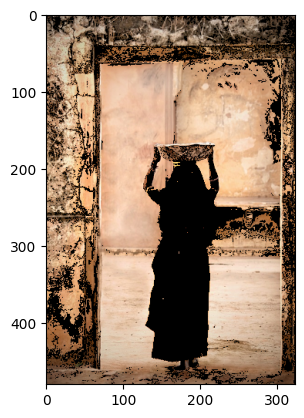

Original image


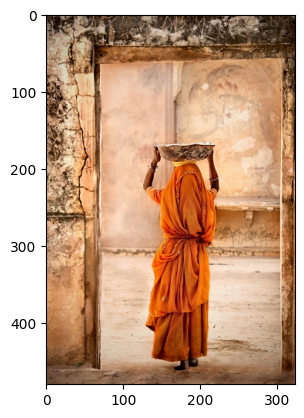

process time in minutes
0.14788118600845337
Results for N=16
total number of iterations:
60
total number of iterations:
39
With Background Pixel


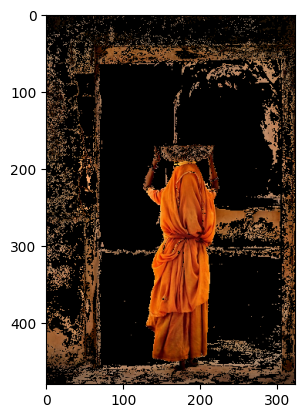

With the foreground pixels


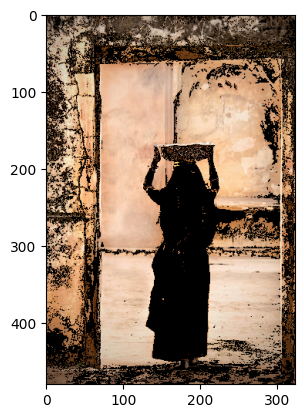

Original image


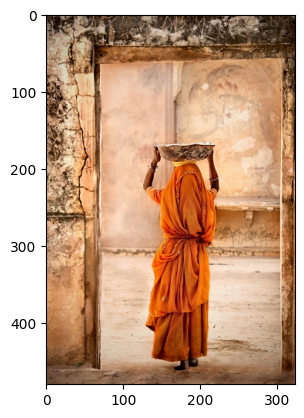

process time in minutes
0.46641867558161415
total number of iterations:
27
total number of iterations:
60
With Background Pixel


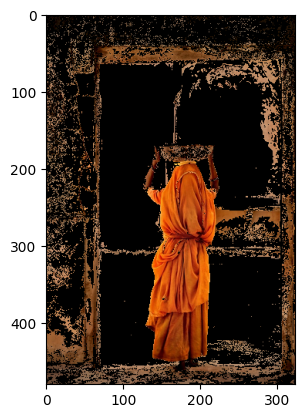

With the foreground pixels


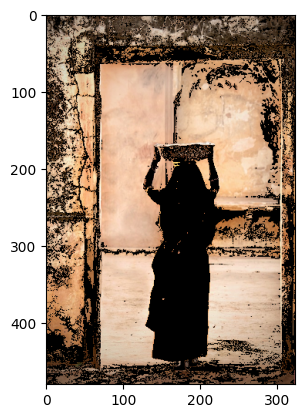

Original image


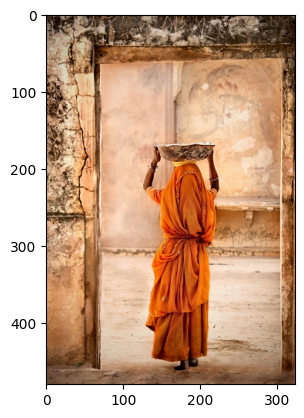

process time in minutes
0.4741355895996094
Results for N=20
total number of iterations:
38
total number of iterations:
27
With Background Pixel


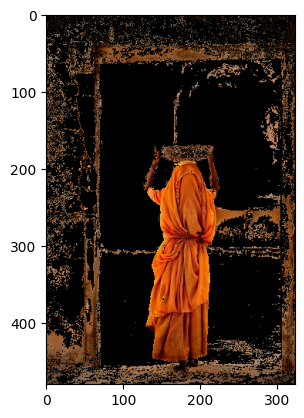

With the foreground pixels


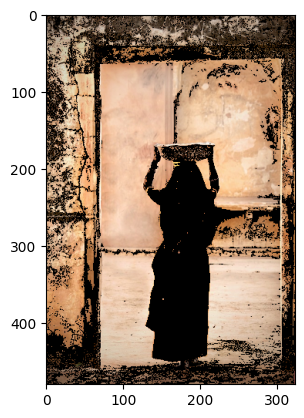

Original image


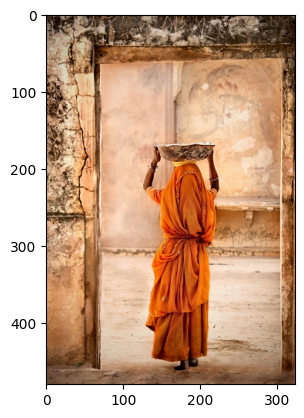

process time in minutes
0.5800901174545288
total number of iterations:
21
total number of iterations:
90
With Background Pixel


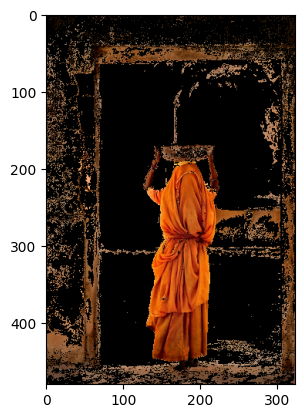

With the foreground pixels


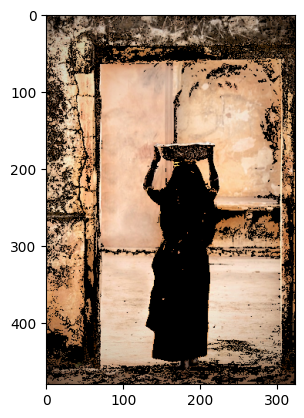

Original image


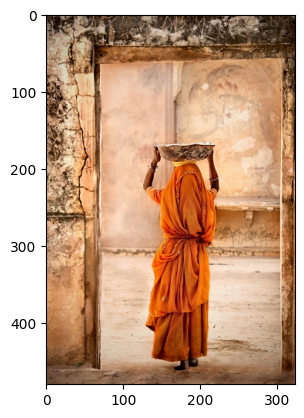

process time in minutes
0.6294205705324809
Results for N=4
total number of iterations:
53
total number of iterations:
43
With Background Pixel


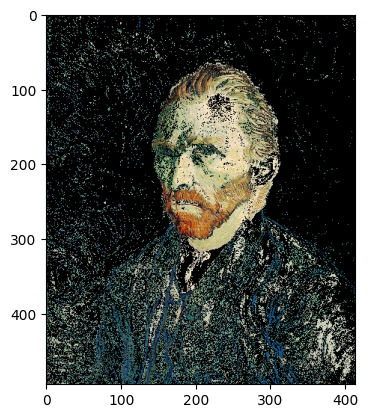

With the foreground pixels


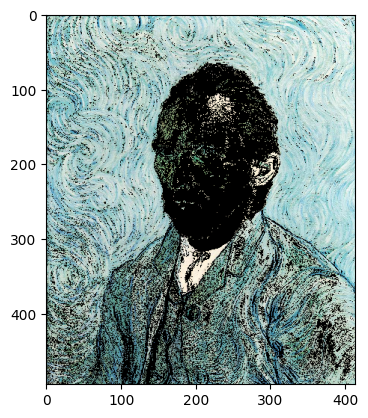

Original image


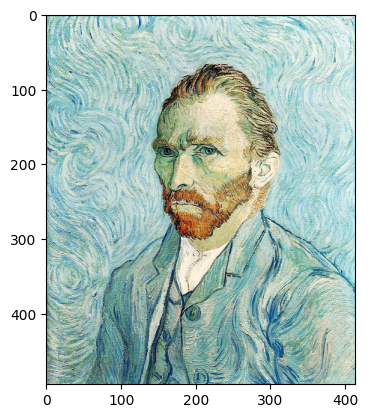

process time in minutes
0.19432530800501505
Results for N=16
total number of iterations:
120
total number of iterations:
176
With Background Pixel


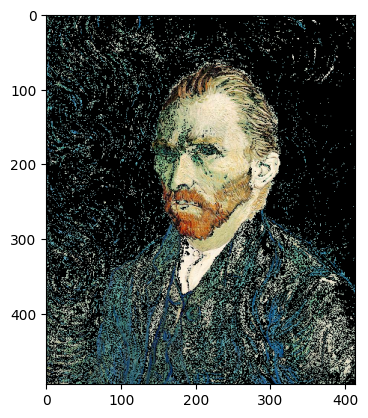

With the foreground pixels


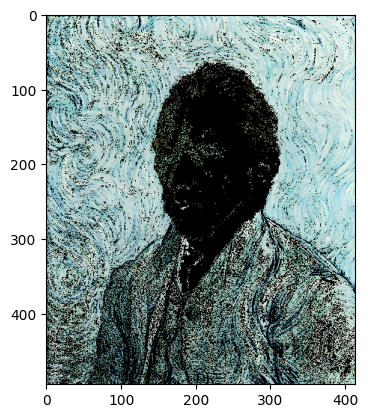

Original image


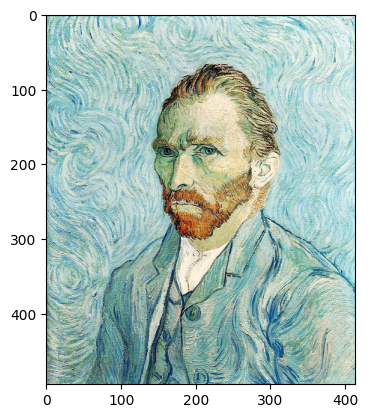

process time in minutes
0.6589927077293396
Results for N=20
total number of iterations:
111
total number of iterations:
201
With Background Pixel


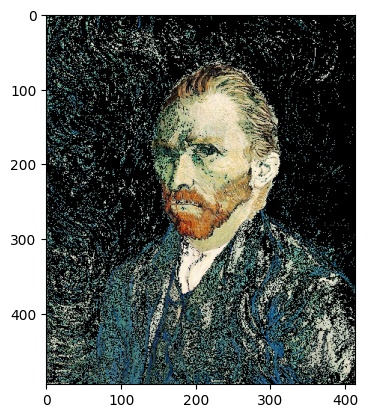

With the foreground pixels


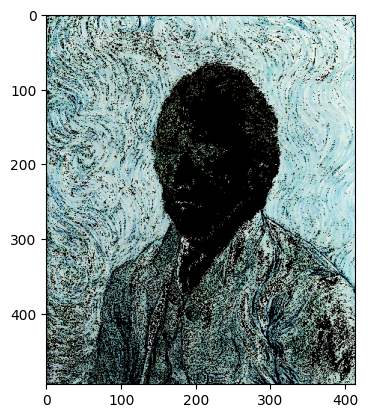

Original image


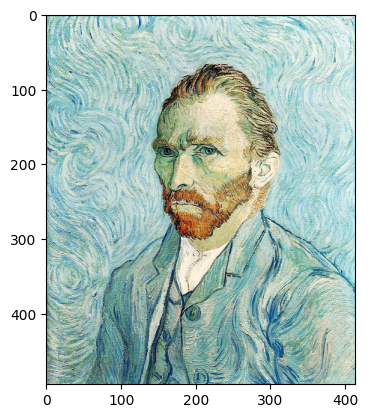

process time in minutes
0.819722839196523


In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
import math
import cv2
from matplotlib import pyplot as plt
from PIL import Image
import time

#extracts foreground and background seed pixels from the stroke images.
def extract_seed_pixels(stroke_im, im):
    arr = np.array(stroke_im)
    arr1 = np.array(im)
    #identifies pixels IE foreground(in red) & background (in blue) in stroke image and extracts their corresponding RGB values from the original image.
    blue = np.array([6, 0, 255])
    red = np.array([255, 0, 0])
    m = 0
    n = 0
    C = []
    D = []
    for i in range(0, len(arr)):
        for j in range(0, len(arr[0])):
            if (arr[i][j][0] == blue[0] and arr[i][j][1] == blue[1] and arr[i][j][2] == blue[2]):
                C.append(arr1[i][j])
                m += 1
            elif (arr[i][j][0] == red[0] and arr[i][j][1] == red[1] and arr[i][j][2] == red[2]):
                D.append(arr1[i][j])
                n += 1
    bg = np.array(C)
    fg = np.array(D)
    # RETURN:one containing the foreground seed pixels and the other containing the background seed pixels.
    return fg, bg

#k (the number of clusters) and arr (the input data points).
def kmeanalgo(k, arr):
    #It initializes cluster centroids randomly and iteratively updates them until convergence.
    centroids = arr[np.random.choice(arr.shape[0], k, replace=False)]
    cent_1 = np.empty_like(centroids)
    it = 0
    while not np.array_equal(cent_1, centroids):
        if it <= 200:
            it += 1
            cent_1 = centroids
            dist = np.linalg.norm(arr[:, np.newaxis] - centroids, axis=2)
            index = np.argmin(dist, axis=1)
            centroids = np.array([arr[index == i].mean(axis=0) for i in range(k)])
        else:
            cent_1 = centroids
    print('total number of iterations:')
    print(it)
    #Returns the final cluster centroids and the cluster index for each data point
    return centroids, index

#function calculate prob of each pixel in the input img belonging to the foreground or background.
def calc_prob(image, fore_cent, back_cent):#centrioid of background cluster and like wise
    im1 = np.array(image)
    fww = 0.1
    bww = 0.1
    b_w = np.zeros([len(im1), len(im1[0]), 3])
    for i in range(0, len(im1)):
        for j in range(0, len(im1[0])):
            p1 = im1[i][j]
            add_fg = 0
            add_bg = 0
            for k in range(0, len(fore_cent)):
               #likelihood of each pixel belonging to foreground & background clusters.
                norm_fg = np.linalg.norm(p1 - fore_cent[k])
                #using exponential function of the negative Euclidean distance between the pixel and cluster centroids
                expo_fg = math.exp(-norm_fg)
                add_fg += (fww * expo_fg)

            for m in range(0, len(back_cent)):
                norm_bg = np.linalg.norm(p1 - back_cent[m])
                expo_bg = math.exp(-norm_bg)
                add_bg += (bww * expo_bg)

            p_fg = add_fg / len(fore_cent)
            p_bg = add_bg / len(back_cent)

            if p_fg > p_bg:
                b_w[i][j] = [255, 255, 255]
            else:
                b_w[i][j] = [0, 0, 0]
     #binary img with segmented results
    return b_w

#visualization
def mydisplay(bw, image):
    im = np.array(image.copy())
    im1 = np.array(image.copy())
    for i in range(len(bw)):
        for j in range(len(bw[0])):
            if bw[i][j][0] == 0:
                im[i][j] = [0, 0, 0]
    for i in range(len(bw)):
        for j in range(len(bw[0])):
            if bw[i][j][0] != 0:
                im1[i][j] = [0, 0, 0]

    dst = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    dst1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
    dst2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    print(f"With Background Pixel")
    plt.imshow(dst)
    plt.show()

    print(f"With the foreground pixels")
    plt.imshow(dst1)
    plt.show()

    print(f"Original image")
    plt.imshow(dst2)
    plt.show()

    return dst2, dst, dst1
# lazy snapping segmentation on the input image using the given stroke images.
def lazySnapping(image, si, N):
  #call functions to extract seed pixels, perform K-means clustering, calculate probabilities, and visualize the segmentation result.
    s_image = si
    st = time.time()
    f, b = extract_seed_pixels(s_image, image)
    cf, i_f = kmeanalgo(N, f)
    cb, ib = kmeanalgo(N, b)
    bw = calc_prob(image, cf, cb)
    img, fog, bag = mydisplay(bw, image)
    ed = time.time()
    print("process time in minutes")
    print((ed - st) / 60)
    return fog, bag

lady = cv2.imread(r'lady.PNG')
ladys1 = Image.open(r'lady stroke 1.png')
ladys2 = Image.open(r'lady stroke 2.png')

# Perform lazy snapping for different values of N
N_values = [4,16,20]
for N in N_values:
    print(f"Results for N={N}")
    lazySnapping(lady, ladys1, N)
    lazySnapping(lady, ladys2, N)

# Load test images
van = cv2.imread(r'van Gogh.PNG')
van1 = Image.open(r'van Gogh stroke.png')

# Perform lazy snapping for different values of N
M_values = [4,16,20]
for N in M_values:
    print(f"Results for N={N}")
    lazySnapping(van, van1, N)


**CHECKING THE EXTRACTED SEED PIXELS**

**Mona Lisa**

Results for N=2
total number of iterations:
6
total number of iterations:
5
With Background Pixel


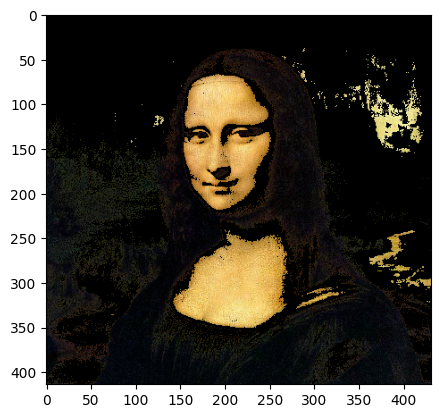

With the foreground pixels


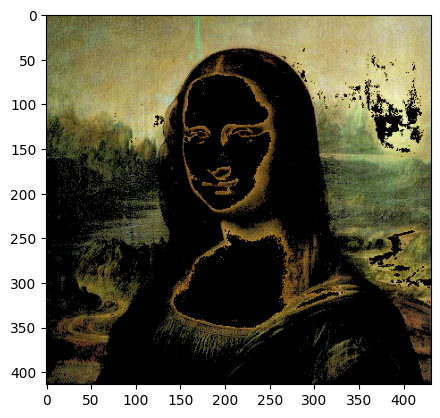

Original image


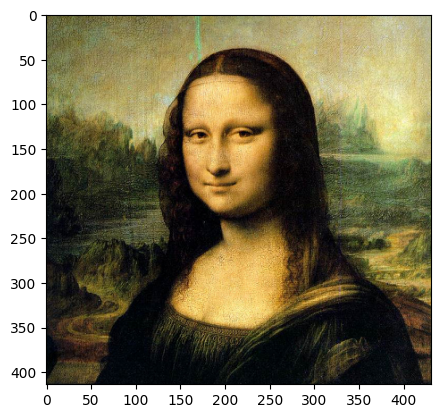

process time in minutes
0.15990055799484254
total number of iterations:
16
total number of iterations:
9
With Background Pixel


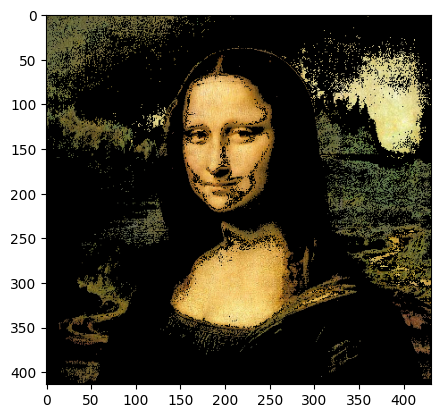

With the foreground pixels


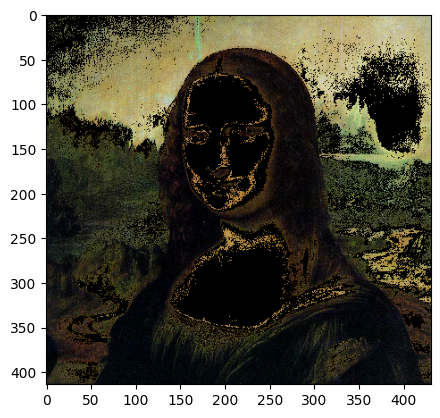

Original image


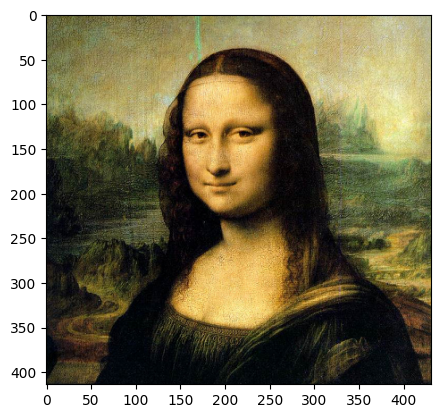

process time in minutes
0.13217707872390747
Results for N=8
total number of iterations:
38
total number of iterations:
38
With Background Pixel


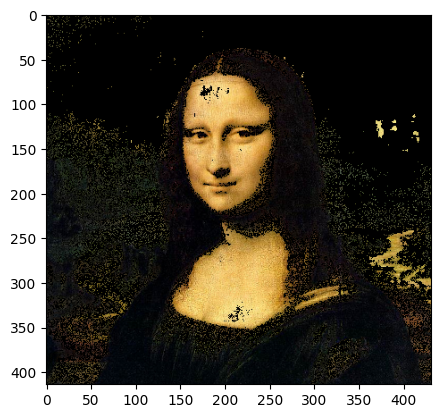

With the foreground pixels


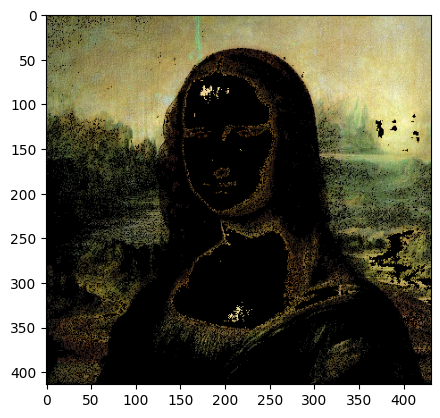

Original image


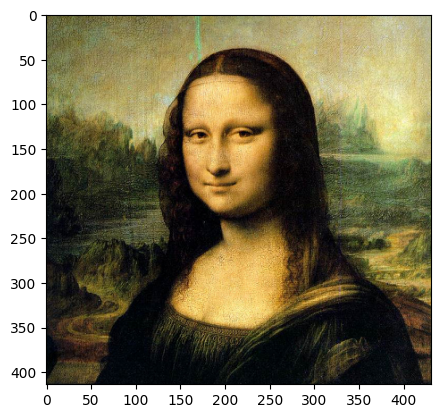

process time in minutes
0.34283810456593833
total number of iterations:
34
total number of iterations:
39
With Background Pixel


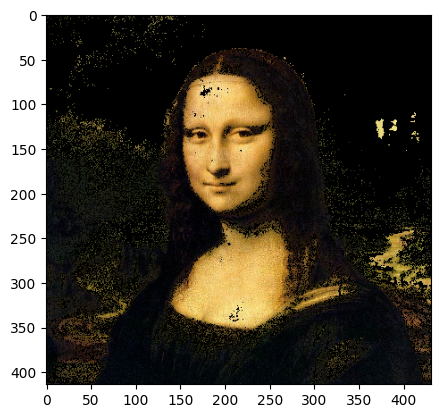

With the foreground pixels


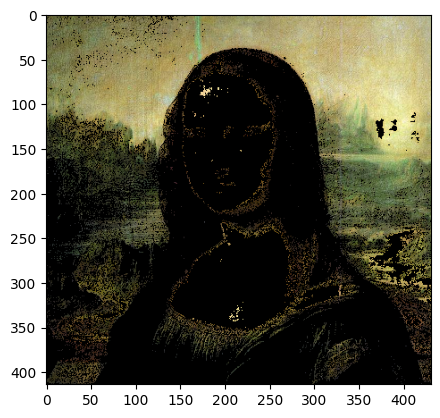

Original image


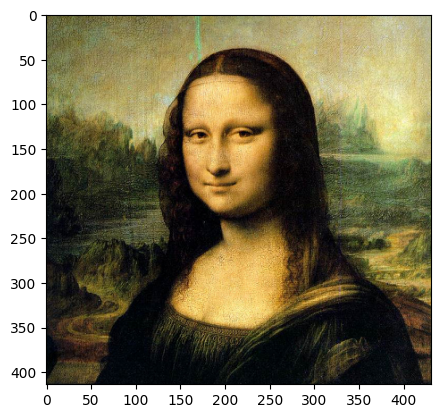

process time in minutes
0.36017085711161295
Results for N=16
total number of iterations:
60
total number of iterations:
34
With Background Pixel


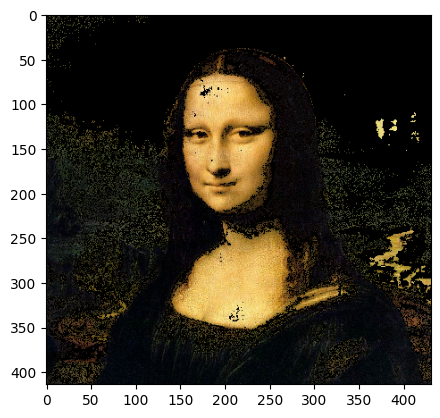

With the foreground pixels


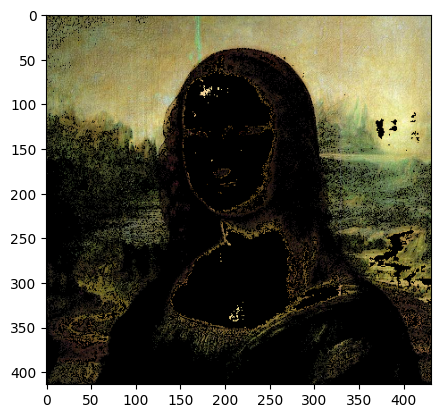

Original image


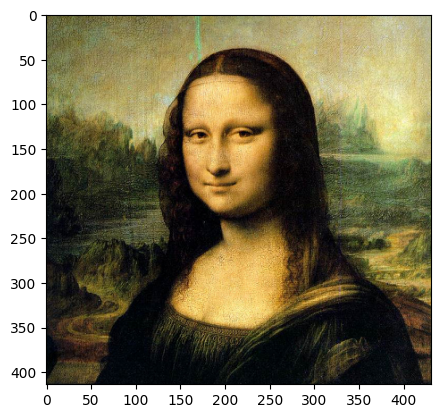

process time in minutes
0.6595864653587341
total number of iterations:
64
total number of iterations:
59
With Background Pixel


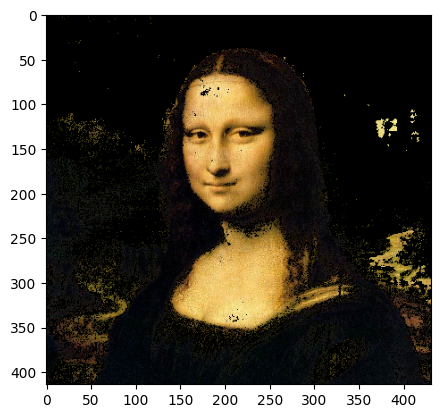

With the foreground pixels


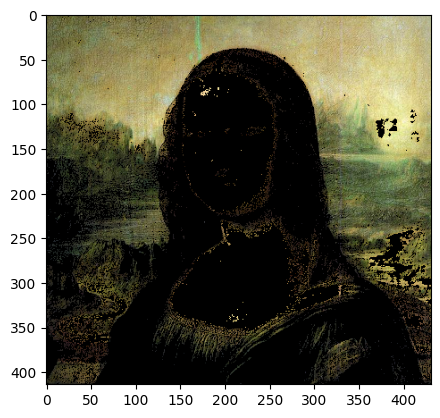

Original image


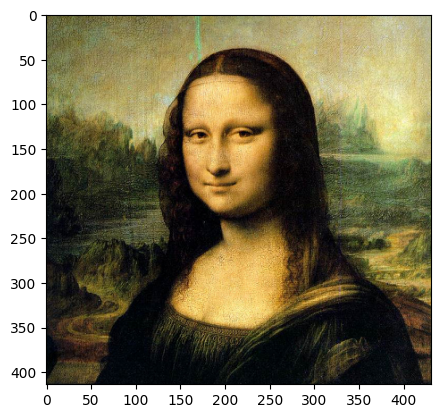

process time in minutes
0.6516895373662313
Results for N=20
total number of iterations:
24
total number of iterations:
51
With Background Pixel


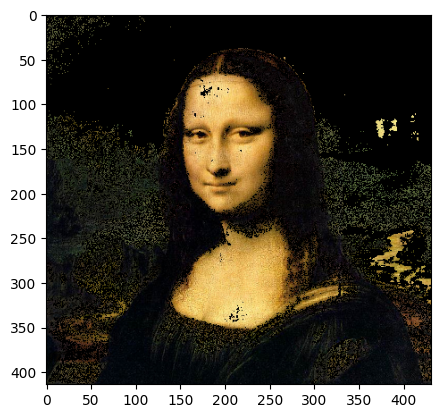

With the foreground pixels


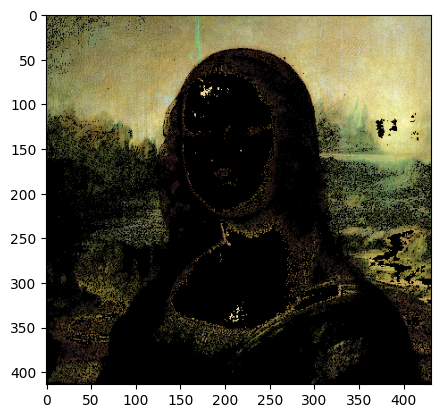

Original image


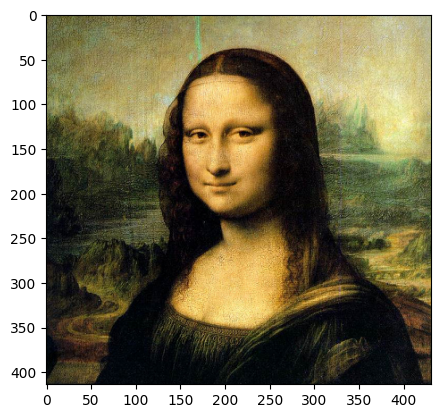

process time in minutes
0.8327347914377848
total number of iterations:
20
total number of iterations:
43
With Background Pixel


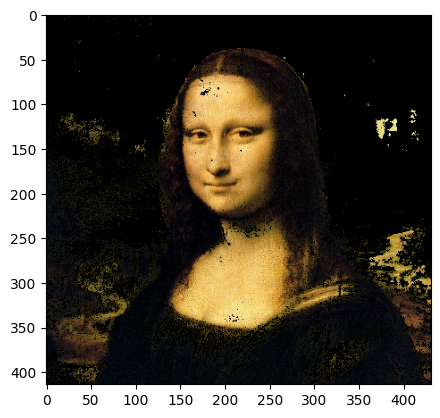

With the foreground pixels


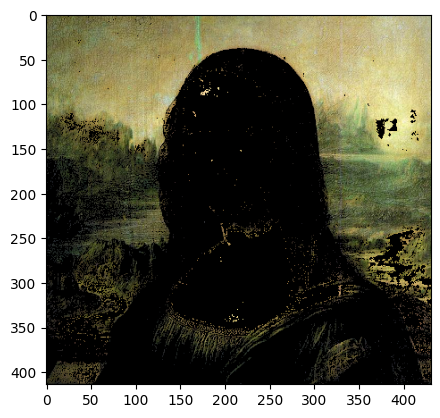

Original image


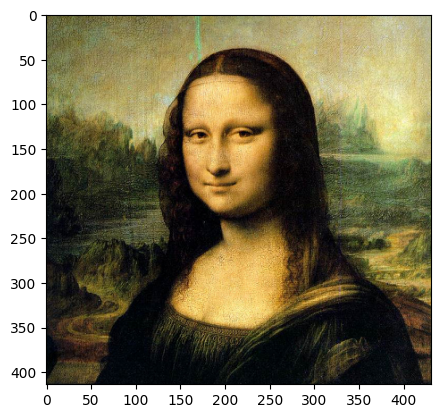

process time in minutes
0.8254426916440328


In [ ]:
from google.colab.patches import cv2_imshow
import pandas as pd
import numpy as np
import math
import cv2
from matplotlib import pyplot as plt
from PIL import Image
import time

def extract_seed_pixels(stroke_im, im):
    arr = np.array(stroke_im)
    arr1 = np.array(im)
    blue = np.array([6, 0, 255])
    red = np.array([255, 0, 0])
    m = 0
    n = 0
    C = []
    D = []

    # Check if stroke image is empty (0-dimensional)
    if len(arr.shape) == 0:
        print("Error: Stroke image is empty!")
        return [], []  # Return empty lists for foreground and background

    for i in range(0, len(arr)):
        for j in range(0, len(arr[0])):
            # Access elements only if the array has dimensions
            if (arr[i][j][0] == blue[0] and arr[i][j][1] == blue[1] and arr[i][j][2] == blue[2]):
                C.append([arr1[i][j][0], arr1[i][j][1], arr1[i][j][2]])
                m = m + 1
            elif (arr[i][j][0] == red[0] and arr[i][j][1] == red[1] and arr[i][j][2] == red[2]):
                D.append([arr1[i][j][0], arr1[i][j][1], arr1[i][j][2]])
                n = n + 1
    bg = np.array(C).reshape(m, 3)
    fg = np.array(D).reshape(n, 3)
    return fg, bg


def kmeanalgo(k, arr):
    centroids = arr[np.random.choice(arr.shape[0], k, replace=False)]
    cent_1 = np.empty_like(centroids)
    it = 0
    while not np.array_equal(cent_1, centroids):
        if it <= 200:
            it += 1
            cent_1 = centroids
            dist = np.linalg.norm(arr[:, np.newaxis] - centroids, axis=2)
            index = np.argmin(dist, axis=1)
            centroids = np.array([arr[index == i].mean(axis=0) for i in range(k)])
        else:
            cent_1 = centroids
    print('total number of iterations:')
    print(it)
    return centroids, index


def calc_prob(image, fore_cent, back_cent):
    im1 = np.array(image)
    fww = 0.1
    bww = 0.1
    b_w = np.zeros([len(im1), len(im1[0]), 3])
    p1 = np.zeros([1, 3])
    for i in range(0, len(im1)):
        for j in range(0, len(im1[0])):
            p1[0][0] = im1[i][j][0]
            p1[0][1] = im1[i][j][1]
            p1[0][2] = im1[i][j][2]
            add_fg = 0
            add_bg = 0
            for k in range(0, len(fore_cent)):
                norm_fg = np.linalg.norm(p1 - fore_cent[k])
                expo_fg = math.exp(-norm_fg)
                add_fg = add_fg + (fww * expo_fg)

            for m in range(0, len(back_cent)):
                norm_bg = np.linalg.norm(p1 - back_cent[m])
                expo_bg = math.exp(-norm_bg)
                add_bg = add_bg + (bww * expo_bg)

            p_fg = add_fg / len(fore_cent)
            p_bg = add_bg / len(back_cent)

            if p_fg > p_bg:
                b_w[i][j] = [255, 255, 255]
            else:
                b_w[i][j] = [0, 0, 0]
    return b_w


def mydisplay(bw, image):
    im = np.array(image.copy())
    im1 = np.array(image.copy())
    for i in range(len(bw)):
        for j in range(len(bw[0])):
            if bw[i][j][0] == 0:
                im[i][j] = [0, 0, 0]
    for i in range(len(bw)):
        for j in range(len(bw[0])):
            if bw[i][j][0] != 0:
                im1[i][j] = [0, 0, 0]

    dst = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    dst1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
    dst2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    print(f"With Background Pixel")
    plt.imshow(dst)
    plt.show()

    print(f"With the foreground pixels")
    plt.imshow(dst1)
    plt.show()

    print(f"Original image")
    plt.imshow(dst2)
    plt.show()
    return dst2, dst, dst1


def lazySnapping(image, si, k):
    s_image = si
    st = time.time()
    f, b = extract_seed_pixels(s_image, image)
    cf, i_f = kmeanalgo(k, f)
    cb, ib = kmeanalgo(k, b)
    bw = calc_prob(image, cf, cb)
    img, fog, bag = mydisplay(bw, image)
    ed = time.time()
    print("process time in minutes")
    print((ed - st) / 60)
    return fog, bag

# Load test images
lisa = cv2.imread(r'Mona-lisa.PNG')
lisa1 = Image.open(r'Mona-lisa stroke 1.png')
lisa2 = Image.open(r'Mona-lisa stroke 2.png')

# Perform lazy snapping for different values of N
M_values = [2,8,16, 20]
for M in M_values:
    print(f"Results for N={M}")
    lazySnapping(lisa, lisa1, M)
    lazySnapping(lisa, lisa2, M)
